In [345]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import seaborn as sns
import re
from pandas_profiling import ProfileReport
from tqdm import tqdm, tqdm_notebook
tqdm_notebook().pandas()
%matplotlib inline


<ipython-input-345-332bc550065a>:11: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  tqdm_notebook().pandas()


D:\Anaconda3\envs\deep-learning\lib\site-packages\tqdm\std.py:658: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [243]:
#Load Boston listingata 
boston_df = pd.read_csv('Data/listings_boston.csv')
#load Boston calendar data show trends in price chagnes
boston_cal = pd.read_csv('Data/calendar_boston.csv')


In [368]:
overview_1 = pd.read_csv('Data/listings_boston.csv')
calendar_1 = pd.read_csv('Data/calendar_boston.csv')


In [372]:
print(overview_1.shape)
print(calendar_1.shape)


(6155, 106)
(2246575, 7)


# We want to see what factors we can use for our first question


we can look into the quality of the data and create our first 
Business questions which we want to answer with the data.

**Hypothesis**:
- What are the main price points of Airbnbs in Boston?
- Do public holidays or seasonality have an influence on the price?
- is it possible to predict the price of an airbnb?


In [245]:
print(boston_df.isnull().sum().sort_values(ascending=False))

xl_picture_url                  6155
neighbourhood_group_cleansed    6155
host_acceptance_rate            6155
jurisdiction_names              6155
license                         6155
                                ... 
maximum_nights                     0
minimum_minimum_nights             0
maximum_minimum_nights             0
minimum_maximum_nights             0
id                                 0
Length: 106, dtype: int64


In [365]:
profile = ProfileReport(boston_df, title='Boston Profiling Report', html={'style':{'full_width':True}})
profile.to_notebook_iframe()

now that we have an overview of the 95 columns in our dataset we want to see what has a high correlation with the price
for that we create a correlationmatrix

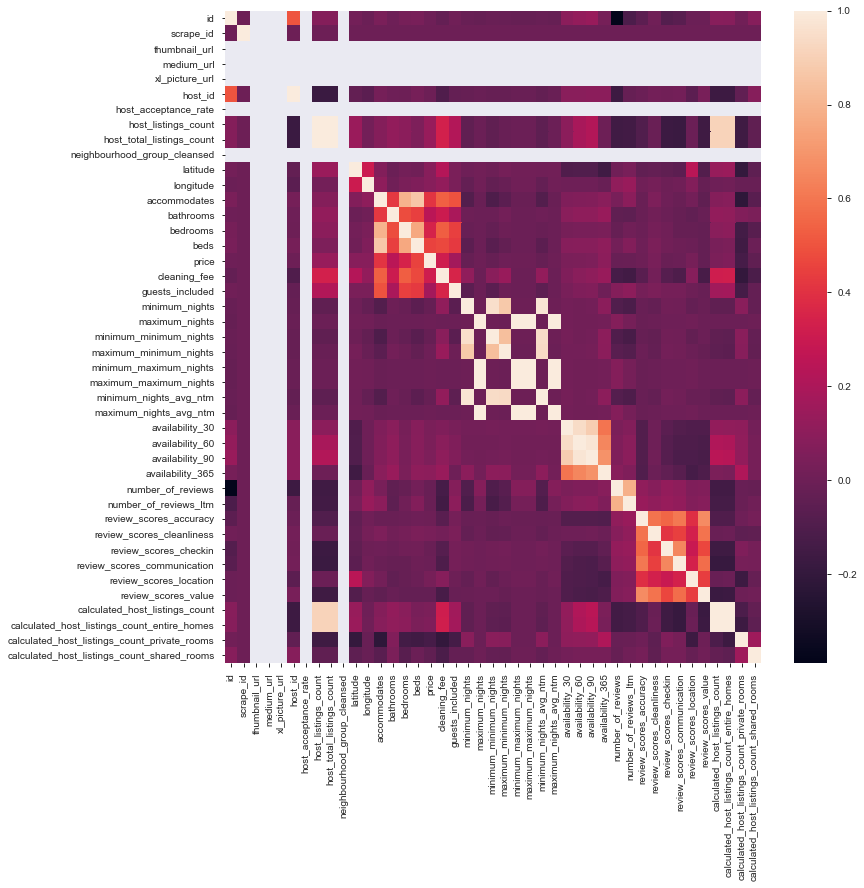

In [373]:
plt.figure(figsize=(12,12));
sns.heatmap(boston_df.corr())

now that we created the heatmap we can see that the price column isn't a number thats why it wont get plotted on the heatmap.

In [247]:
boston_df[['monthly_price','weekly_price','price']].head()

,monthly_price,weekly_price,price
0,"$2,250.00",$750.00,$125.00
1,"$3,000.00",$980.00,$145.00
2,NaN,NaN,$169.00
3,"$1,350.00",$395.00,$65.00
4,"$2,900.00","$1,200.00",$99.00


as we can see there are alot of NaN entries and also dollar signs infront of the price which we need to remove.

In [249]:
"""
Before plotting and checking for seasonal changes we need to clean the Data in the price column

"""
boston_df[['monthly_price','weekly_price','price','cleaning_fee']]= boston_df[['monthly_price','weekly_price','price','cleaning_fee']].replace({'\$': '', ',': ''}, regex=True)
boston_df = boston_df.astype({'price': 'float64'})
boston_df = boston_df.astype({'monthly_price': 'float64'})
boston_df = boston_df.astype({'weekly_price': 'float64'})
boston_df = boston_df.astype({'cleaning_fee': 'float64'})

In [251]:
#droping the columns with many and only null values
boston_df = boston_df.drop(['square_feet','has_availability','review_scores_rating', 'host_response_rate', 'reviews_per_month','license','jurisdiction_names','weekly_price','monthly_price'],axis=1)
#lets drop the empty rows in host_name bedroom, bathroom, beds and accomodates
boston_df = boston_df.dropna(axis=0, subset=['host_name', 'beds', 'bathrooms', 'bedrooms','accommodates'])
boston_df = boston_df[boston_df.bathrooms >0]
boston_df = boston_df[boston_df.bedrooms > 0]
boston_df = boston_df[boston_df.beds > 0]
boston_df = boston_df[boston_df.accommodates  > 0]


In [257]:
boston_df.isnull().sum()

id                                              0
listing_url                                     0
scrape_id                                       0
last_scraped                                    0
name                                            1
                                               ..
require_guest_phone_verification                0
calculated_host_listings_count                  0
calculated_host_listings_count_entire_homes     0
calculated_host_listings_count_private_rooms    0
calculated_host_listings_count_shared_rooms     0
Length: 97, dtype: int64

In [258]:
#time again for the matrix but before that lets make our dataframe a littlebit smaller
matrix_df = boston_df[['price','bedrooms','accommodates','bathrooms','minimum_nights','availability_30','number_of_reviews']]

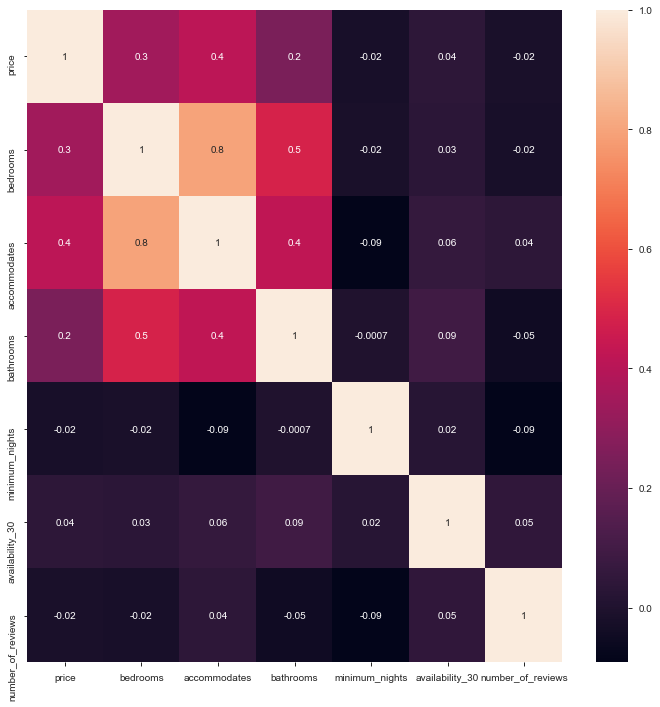

In [259]:
plt.figure(figsize=(12,12));
sns.heatmap(matrix_df.corr(),annot = True, fmt='.1g')

In [260]:
room_df=boston_df.groupby('room_type').id.count()
room_df

room_type
Entire home/apt    3400
Private room       1985
Shared room          72
Name: id, dtype: int64

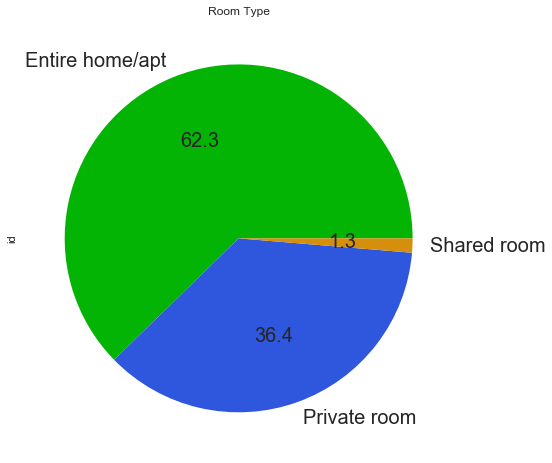

In [261]:
room_df.plot.pie(figsize=(8, 8), fontsize = 20, autopct = '%.1f', title = 'Room Type',colors = ['#04B404','#2E57DE', '#D58F0C']);

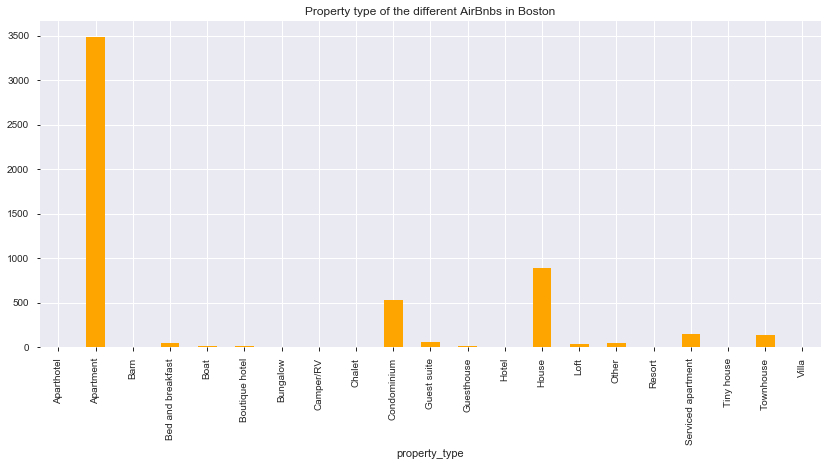

In [262]:
property_df=boston_df.groupby('property_type').id.count()
property_df.plot.bar(figsize=(14, 6),title="Property type of the different AirBnbs in Boston",color="orange")

In [377]:
boston_df.groupby('property_type').id.count()

property_type
Aparthotel               1
Apartment             3488
Barn                     1
Bed and breakfast       44
Boat                    14
Boutique hotel          17
Bungalow                 4
Camper/RV                2
Chalet                   1
Condominium            535
Guest suite             61
Guesthouse               9
Hotel                    5
House                  888
Loft                    39
Other                   52
Resort                   2
Serviced apartment     152
Tiny house               1
Townhouse              134
Villa                    7
Name: id, dtype: int64

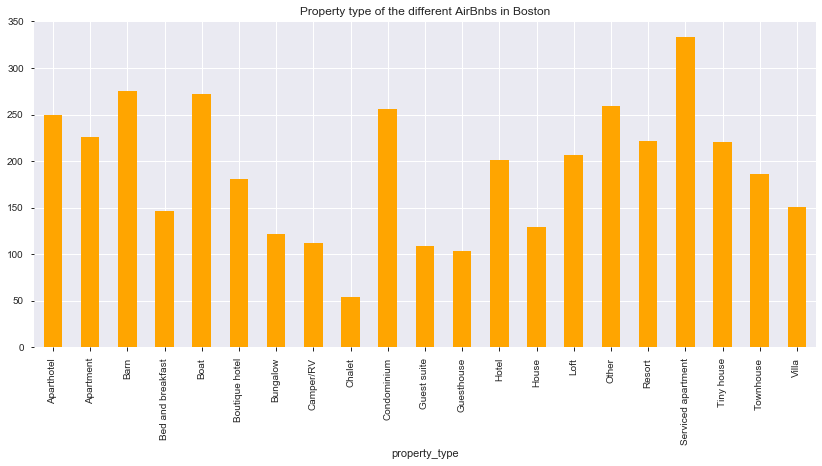

In [376]:
property_df=boston_df.groupby('property_type').price.mean()
property_df.plot.bar(figsize=(14, 6),title="Property type of the different AirBnbs in Boston",color="orange")

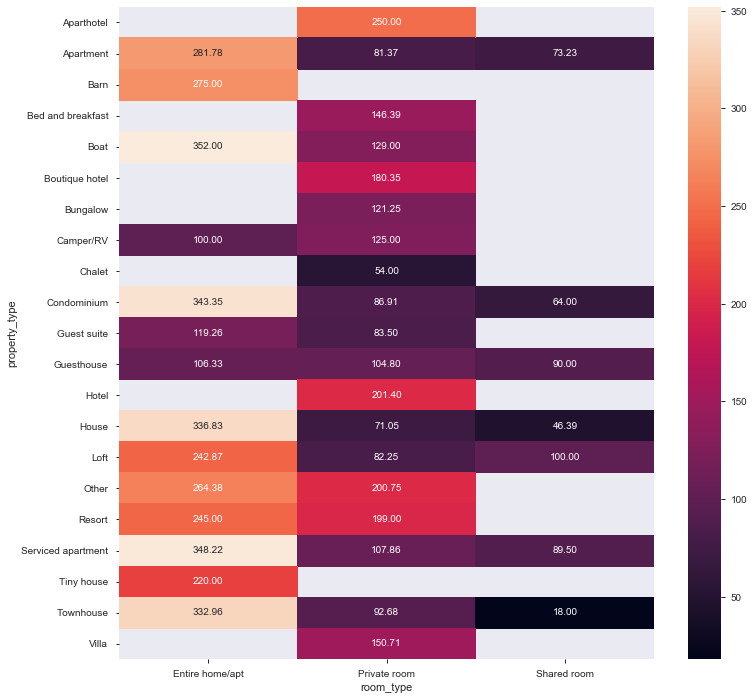

In [263]:
plt.figure(figsize=(12,12));
sns.heatmap(boston_df.groupby(['property_type','room_type']).price.mean().unstack(),annot = True, fmt='.2f')

In [191]:
import folium
from folium.plugins import HeatMap
#the max price will be used as indicator for the color of the heatmap
max_amount = float(boston_df['price'].max())
hmap = folium.Map(location=[42.36, -71.05], zoom_start=12, )
hm_wide = HeatMap( list(zip(boston_df.latitude.values, boston_df.longitude.values, boston_df.price.values)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=17, blur=15, 
                   max_zoom=1, 
                 )
hmap.add_child(hm_wide)


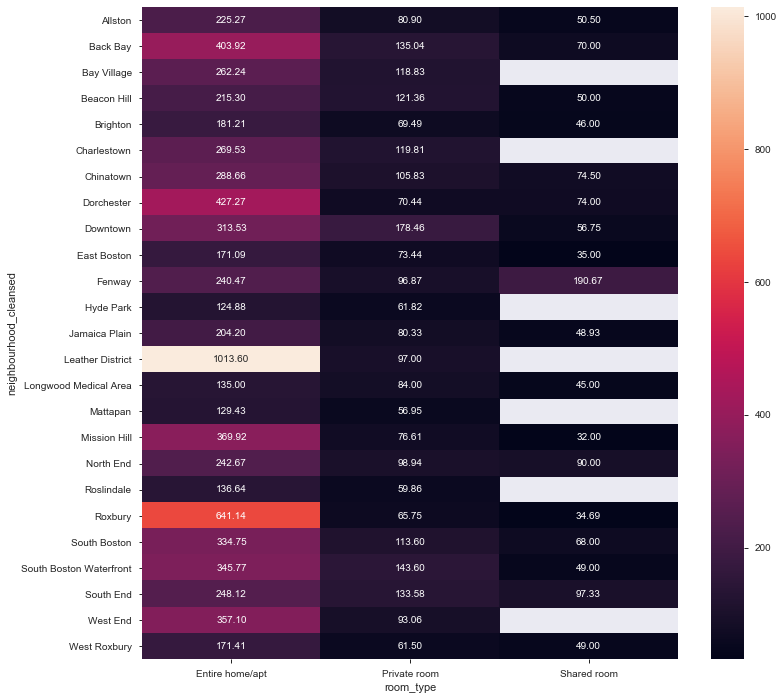

In [264]:
plt.figure(figsize=(12,12));
sns.heatmap(boston_df.groupby(['neighbourhood_cleansed','room_type']).price.mean().unstack(),annot = True, fmt='.2f')

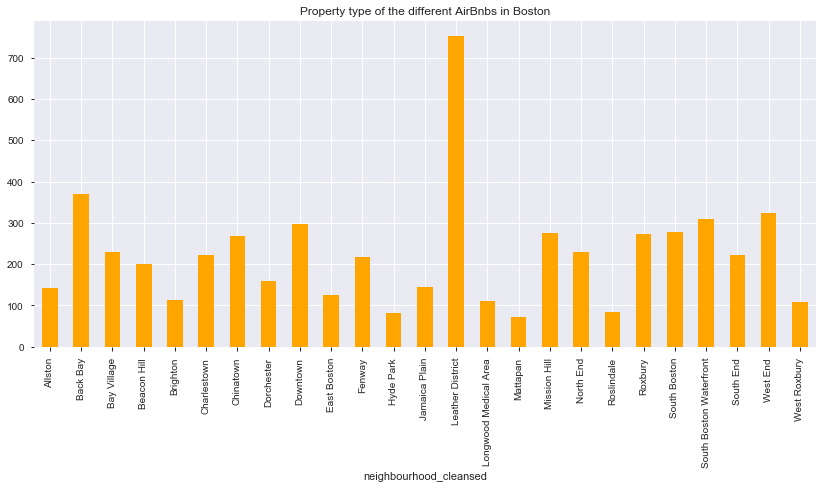

In [265]:
neighbourhood=boston_df.groupby(['neighbourhood_cleansed']).price.mean()

neighbourhood.plot.bar(figsize=(14, 6),title="Property type of the different AirBnbs in Boston",color="orange")

## Conclusion
the most expensive AirBnbs are around the water area as the map and the heatmap shows.
- whole Apartments
- more rooms lead to more people staying so the place will be more expensive

# Seasonal Changes on the Price

In [266]:
# like with the listing dataset we need to replace the dollar signs and the datatypes
boston_cal['price']= boston_cal['price'].replace({'\$': '', ',': ''}, regex=True)
boston_cal = boston_cal.astype({'price': 'float64'})

In [267]:
#first let's create a month and year column
import datetime
def get_year(date):
    """
    args: date in the formate Year - Month - Day 
    
    return: Year
    """
    date = datetime.datetime.strptime(date, "%Y-%m-%d")
    return date.year

def get_month(date):
    """
    args: date in the formate Year - Month - Day 
    
    return: month
    """
    date = datetime.datetime.strptime(date, "%Y-%m-%d")
    return date.month

def get_day(date):
    
    """
    args: date in the formate Year - Month - Day 
    
    return: month
    """
    date = datetime.datetime.strptime(date, "%Y-%m-%d")

    return date.day


In [268]:
boston_cal['Month'] = boston_cal['date'].progress_apply(lambda x: get_month(x))
boston_cal['Day'] = boston_cal['date'].progress_apply(lambda x: get_day(x))
boston_cal['Year'] = boston_cal['date'].progress_apply(lambda x: get_year(x))

In [269]:
season_df=boston_cal.groupby(['Year','Month']).price.mean()

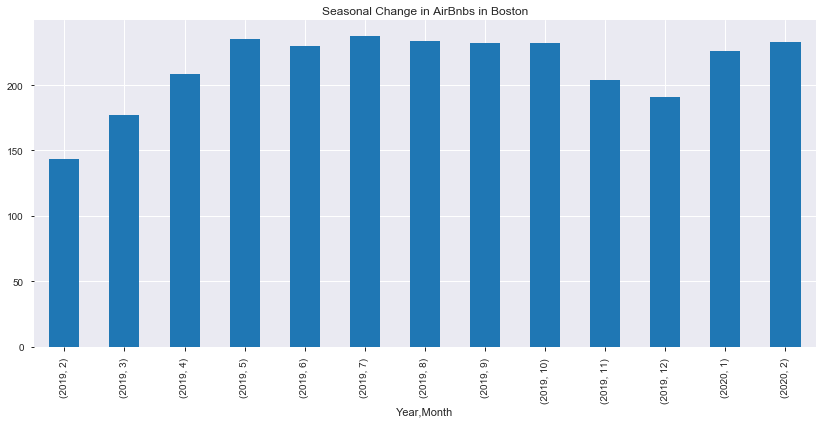

In [270]:
season_df.plot.bar(figsize=(14, 6),title="Seasonal Change in AirBnbs in Boston")

#### Lets start with our first Hypothesis
public holidays and seasonality have an influence on the prices <br>
lets look into the data

In [271]:
import calendar
import holidays


def get_usholiay(date):
    us_holidays = holidays.US()
    return us_holidays.get(date)
def get_day_name(date):
    day = date[-2:]
    year = date[:4]
    month= date[5:7]
    datenew = datetime.date(int(year),int(month),int(day))
    return calendar.day_name[datenew.weekday()]
def get_weekday_num(date):
    day = date[-2:]
    year = date[:4]
    month= date[5:7]
    datenew = datetime.date(int(year),int(month),int(day))
    return datenew.weekday()

In [198]:
boston_cal.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,Month,Day,Year
0,225224,2019-02-09,t,105.0,$105.00,1,365,2,9,2019
1,225224,2019-02-10,t,105.0,$105.00,1,365,2,10,2019
2,225224,2019-02-11,t,105.0,$105.00,1,365,2,11,2019
3,225224,2019-02-12,t,105.0,$105.00,1,365,2,12,2019
4,225224,2019-02-13,t,105.0,$105.00,1,365,2,13,2019


In [272]:
boston_cal['us_holidays_name'] = boston_cal['date'].progress_apply(lambda x: get_usholiay(x))
boston_cal['Day_name'] = boston_cal['date'].progress_apply(lambda x: get_day_name(x))

boston_cal.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,Month,Day,Year,us_holidays_name,Day_name
0,225224,2019-02-09,t,105.0,$105.00,1,365,2,9,2019,None,Saturday
1,225224,2019-02-10,t,105.0,$105.00,1,365,2,10,2019,None,Sunday
2,225224,2019-02-11,t,105.0,$105.00,1,365,2,11,2019,None,Monday
3,225224,2019-02-12,t,105.0,$105.00,1,365,2,12,2019,None,Tuesday
4,225224,2019-02-13,t,105.0,$105.00,1,365,2,13,2019,None,Wednesday


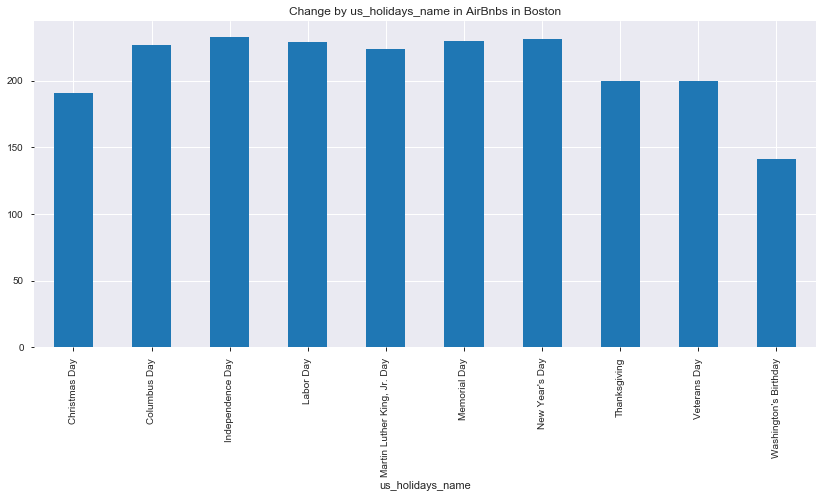

In [273]:
week_df = boston_cal.groupby(['us_holidays_name']).price.mean()
week_df.plot.bar(figsize=(14, 6),title="Change by us_holidays_name in AirBnbs in Boston")

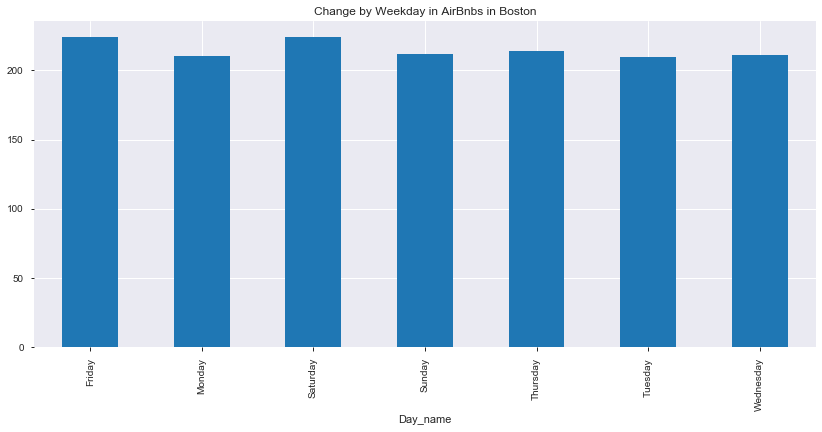

In [274]:
week_df = boston_cal.groupby(['Day_name']).price.mean()
week_df.plot.bar(figsize=(14, 6),title="Change by Weekday in AirBnbs in Boston")

### Feature Generation

time to turn the objects into categories for future predictions
<br>
before creating more features we need to clean some of the columns we have

In [298]:
boston_df_pred = boston_df[['id','neighbourhood_cleansed','property_type','room_type','accommodates','bathrooms','bedrooms','beds','amenities','price','cleaning_fee','number_of_reviews','cancellation_policy']]
#boston_df_pred['cleaning_fee']= boston_df_pred['cleaning_fee'].replace({'\$': '', ',': ''}, regex=True)
#boston_df_pred = boston_df_pred.astype({'cleaning_fee': 'float64'})

In [277]:
boston_df_pred.amenities.head()

0    {TV,"Cable TV",Wifi,"Air conditioning",Kitchen...
1    {TV,"Cable TV",Internet,Wifi,"Air conditioning...
2    {TV,"Cable TV",Internet,Wifi,"Air conditioning...
3    {TV,"Cable TV",Wifi,"Air conditioning",Kitchen...
4    {TV,"Cable TV",Internet,Wifi,"Air conditioning...
Name: amenities, dtype: object

In [323]:
boston_df_pred['amenities'] =boston_df_pred['amenities'].str.replace('[{}" ]', '')
#now we create features out of the string variables
boston_amenities = boston_df_pred.amenities.str.get_dummies(sep = ",")
boston_features = boston_df_pred.select_dtypes(include=['object'])
boston_features = boston_features.drop(['amenities'], axis=1)
boston_features = pd.get_dummies(boston_features)
boston_int_feat = boston_df_pred.select_dtypes(include=['float','int64'])

<ipython-input-323-a13a12ffef2c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  boston_df_pred['amenities'] =boston_df_pred['amenities'].str.replace('[{}" ]', '')


In [324]:
boston_prep = pd.concat([boston_int_feat,boston_features,boston_amenities],axis=1, join='inner')

In [325]:
boston_prep.head()

,id,accommodates,bathrooms,bedrooms,beds,price,cleaning_fee,number_of_reviews,neighbourhood_cleansed_Allston,neighbourhood_cleansed_Back Bay,...,Wideclearancetobed,Wideclearancetoshower,Widedoorway,Wideentryway,Widehallwayclearance,Wifi,Windowguards,toilet,translationmissing:en.hosting_amenity_49,translationmissing:en.hosting_amenity_50
0,3781,2,1.0,1.0,1.0,125.0,75.0,14,0,0,...,0,0,0,0,0,1,0,0,1,1
1,5506,2,1.0,1.0,1.0,145.0,40.0,80,0,0,...,0,0,0,0,0,1,0,0,0,0
2,6695,4,1.0,1.0,2.0,169.0,70.0,85,0,0,...,0,0,0,0,0,1,0,0,0,0
3,6976,2,1.0,1.0,1.0,65.0,0.0,75,0,0,...,0,0,0,0,0,1,0,0,1,1
4,8789,2,1.0,1.0,1.0,99.0,250.0,22,0,0,...,0,0,0,0,0,1,0,0,0,0


In [326]:
#check if any null values are there before modelling
boston_prep.isnull().sum().any()

True

In [327]:
list(boston_prep.columns)

['id',
 'accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'price',
 'cleaning_fee',
 'number_of_reviews',
 'neighbourhood_cleansed_Allston',
 'neighbourhood_cleansed_Back Bay',
 'neighbourhood_cleansed_Bay Village',
 'neighbourhood_cleansed_Beacon Hill',
 'neighbourhood_cleansed_Brighton',
 'neighbourhood_cleansed_Charlestown',
 'neighbourhood_cleansed_Chinatown',
 'neighbourhood_cleansed_Dorchester',
 'neighbourhood_cleansed_Downtown',
 'neighbourhood_cleansed_East Boston',
 'neighbourhood_cleansed_Fenway',
 'neighbourhood_cleansed_Hyde Park',
 'neighbourhood_cleansed_Jamaica Plain',
 'neighbourhood_cleansed_Leather District',
 'neighbourhood_cleansed_Longwood Medical Area',
 'neighbourhood_cleansed_Mattapan',
 'neighbourhood_cleansed_Mission Hill',
 'neighbourhood_cleansed_North End',
 'neighbourhood_cleansed_Roslindale',
 'neighbourhood_cleansed_Roxbury',
 'neighbourhood_cleansed_South Boston',
 'neighbourhood_cleansed_South Boston Waterfront',
 'neighbourhood_cleansed_South End'

# Modeling

In [346]:
#splitting into explanatory and response variables
X = boston_prep.drop(['price', 'id', 'cleaning_fee'], axis=1)
y = boston_prep['price']

#splitting the dataset into train and test
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size = 0.15, 
                                                    random_state = 43)

#showing the results of the split
print("Training set has {} samples.".format(X_train.shape[0]))
print("Testing set has {} samples.".format(X_test.shape[0]))

Training set has 4638 samples.
Testing set has 819 samples.


In [347]:
# Time to try different models for predicting the price of a property


In [353]:
from sklearn import metrics
#LinearRegression
#reg = LinearRegression().fit()
#reg.score(X_test, y_test)
linear_reg = linear_model.LinearRegression()
linear_reg.fit(X_train, y_train)
linear_reg_error = metrics.median_absolute_error(y_test, linear_reg.predict(X_test))

print ("Linear Regression: " + str(linear_reg_error))


Linear Regression: 104.8984375


In [356]:
from sklearn import linear_model
reg = linear_model.BayesianRidge(normalize=True)
reg.fit(X_train, y_train)
bayesan_err = metrics.median_absolute_error(y_test, reg.predict(X_test))
print ("Linear Regression: " + str(bayesan_err))

Linear Regression: 92.13424670636604


In [358]:
from sklearn import tree

dectree = tree.DecisionTreeRegressor(max_depth=5,random_state=0)
dectree = dectree.fit(X_train, y_train)
dectree.score(X_test, y_test)
tree_err = metrics.median_absolute_error(y_test, dectree.predict(X_test))
print ("Linear Regression: " + str(tree_err))

Linear Regression: 44.19966996699671


In [337]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import GridSearchCV
import xgboost as xgb

In [359]:
xg_reg = xgb.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 5, n_estimators = 100)

In [362]:
xg_reg.fit(X_train,y_train)

preds = xg_reg.predict(X_test)

xgboost_err = metrics.median_absolute_error(y_test, xg_reg.predict(X_test))
print ("Linear Regression: " + str(xgboost_err))

[17:07:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.0.0/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
Linear Regression: 40.33833312988281
